## 本文件支持的版本：v5.5.0, v5.6.0, v5.10.10

In [1]:
import sys
sys.path.append("../..")

In [2]:
from api.design import Design
from addict import Dict
# 定义design类，design类用来控制gds、topology和equivalent_circuit类，
# 即量子芯片的gds版图、拓扑图以及等效电路相关操作都可以用design类进行控制实现
design = Design() 

svg文件保存在：./svg/Gds.svg


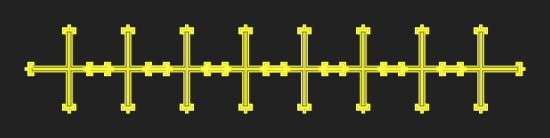

In [3]:
# 从中间向两边生成量子比特行
design.gds.qubits.generate_row_middle(mid_pos = (0, 0),             # 中间量子比特的位置
                                      dist = 500,                   # 相邻两个量子比特的间隔
                                      key = "gds_pos",              # 设置要赋值的参数名，此处将每个量子比特的位置坐标赋值给design类中的gds_pos
                                      num = 8,                      # 要生成的量子比特数量
                                      pre_name = "q",               # 要生成的量子比特的名称前缀，此处设置为q之后，量子比特名称就是q0、q1、q2....
                                      type = "Xmon")                # 设置量子比特的类型
design.gds.show_svg ()                 #显示lib对应的gds版图为svg图像
design.gds.show_gds()                 #显示lib对应的gds版图

In [4]:
# 设置参数
options = Dict(
    cross_height = 150,
    connect_pad_options = [0, 1, 0, 0],
    claw_length = 30
)
design.gds.qubits.change_options(options)       # 添加芯片层
design.gds.show_gds()    

svg文件保存在：./svg/Gds.svg


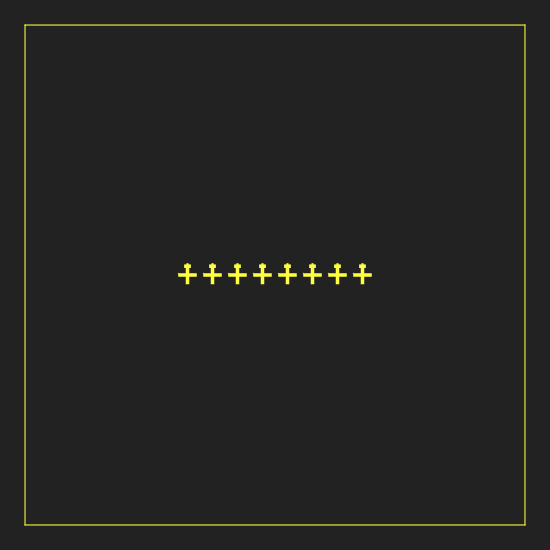

In [5]:
# 设置参数
options = Dict(
    name = "chip0",                 # 芯片层名称
    type = "RecChip",               # 芯片层类型
    start_pos = (-5000, -5000),     # 芯片层起始坐标，即左下角坐标
    end_pos = (5000, 5000)          # 芯片层终止坐标，即右上角坐标
)
design.gds.chips.add(options)       # 添加芯片层
design.gds.show_svg()               # 显示lib对应的gds版图为svg图像

svg文件保存在：./svg/Gds.svg


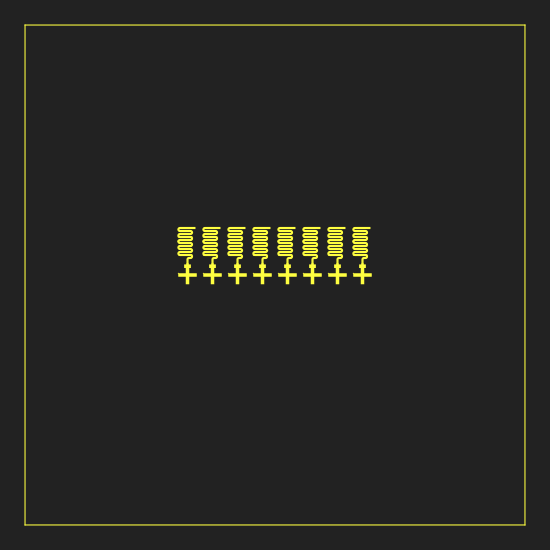

In [6]:
# 设置几何参数，可以通过设置几何参数来调整读取线的物理属性
geometric_options = Dict(
    coupling_length = 300,          # 耦合线长度，即      
    width = 10,                     # 耦合线宽度，即黄线的空心宽度
    gap = 6,                        # 耦合线刻蚀宽度，即黄线本身的宽度
    outline = [],
    # 几何参数
    height = 600,                   # cpw高度
    finger_length = 100,            # 
    finger_orientation =90,         # 
    start_dir = "top",              # cpw初始拐弯方向
    start_length = 30,              # 靠近量子比特处直线长度
    length = 3000,                  # 耦合线总长度
    space_dist = 60,                # 相邻拐弯处的距离
    radius = 30,                    # 耦合线拐角半径
    cpw_orientation = 90            # cpw朝向
)
# 生成读取线行
design.gds.readout_lines.generate_row(start_pos=(-1750, 210),               # 最左边读取线的位置坐标
                                      dist=500,                             # 相邻两个读取线的距离
                                      key="start_pos",                      # 要赋值的参数名
                                      num=8,                                # 读取线数量
                                      pre_name="readout_cavity",            # 读取线名称前缀
                                      type="ReadoutLineFingerPlus",         # 读取线类型
                                      geometric_options=geometric_options)
design.gds.show_svg()

svg文件保存在：./svg/Gds.svg


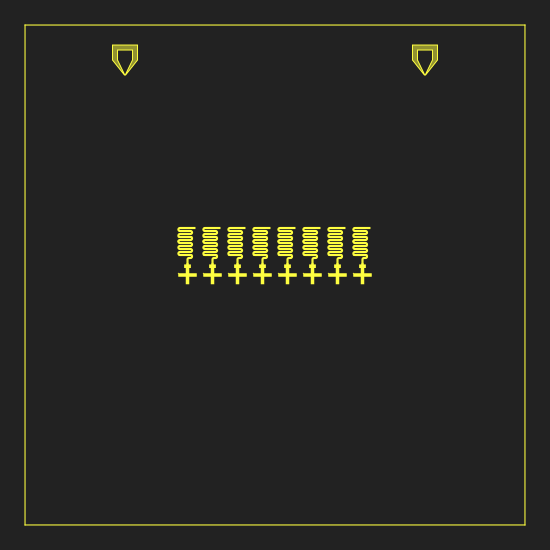

In [7]:
# 设置引脚的几何参数
# 参数待添加***************************************************************
geometric_options = Dict(
    trace_width=10,
    trace_gap=6,
    taper_height=300,
    pad_width=300,
    pad_height=200,
    pad_gap=100,
    orientation=0,
    start_straight=2000,
    distance_to_chip=350,
    distance_to_qubits=3650
)
# 批量生成引脚
design.gds.pins.batch_generate(pos_list=[(-3000, 4000), (3000, 4000)],      # 要生成的引脚的坐标位置
                               key="pos",                                   # 要赋值的参数名，
                               pre_name="top_pin",                          # 引脚名称前缀
                               type="LaunchPad",                            # 引脚类型
                               geometric_options=geometric_options)
design.gds.show_svg()

svg文件保存在：./svg/Gds.svg


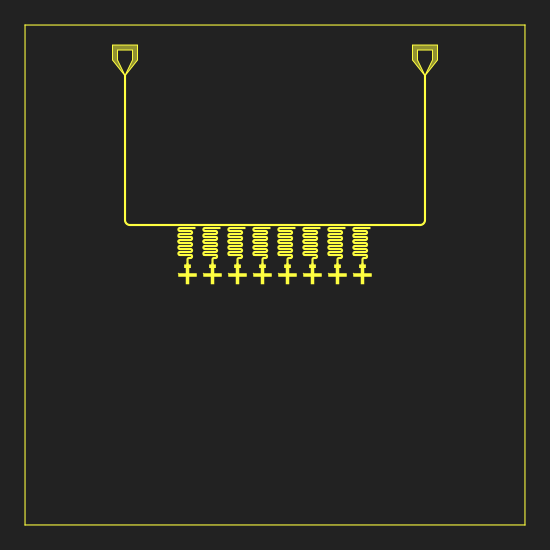

In [8]:
# 设置传输线参数
options = Dict(
    name = "tml0",                                                      # 传输线名称
    type = "TransmissionPath",                                          # 传输线类型
    pos = [(-3000, 4000),(-3000, 1000) , (3000, 1000), (3000, 4000)],   # 传输线坐标点集合
    corner_radius = 100                                                 # 拐角半径
)
design.gds.transmission_lines.add(options)                              # 添加传输线
design.gds.show_svg()
design.gds.show_gds()

svg文件保存在：./svg/Gds.svg


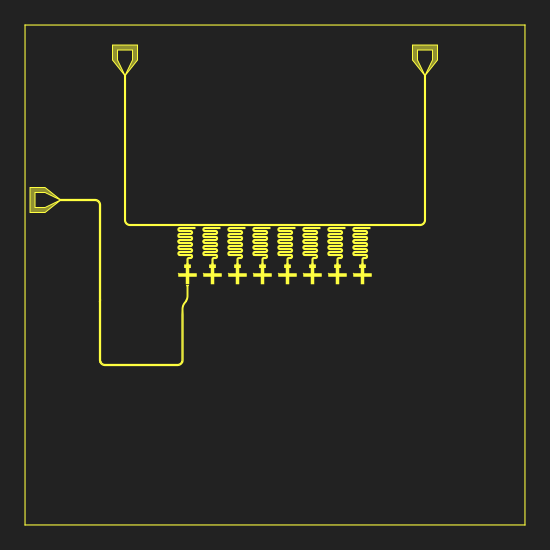

In [9]:
# 设置要添加的线的参数
# 参数说明**********************************************************************************
options = Dict(
    # 框架
    name="ZlineNju0",                                                                                          # 线名称
    type="ZlineNju",                                                                                           # 线类型
    chip="chip0",                                                                                              # 所在芯片层
    line_init_pos = [(-4300, 1500), (-3500, 1500), (-3500, -1800), (-1850, -1800), (-1850, -800)],             # 
    line_end_pos = [(-1850, -600), (-1750, -500), (-1750, -220)],                                              # 
    width = [15,10],
    gap = [5,4],
    short_width = 12,
    short_height = 4,
    long_short_gap = 4,
    long_width_left = 24,
    long_width_right = 12,
    long_height = 2,
    buffer_length = 100,
    corner_radius = [100,200],
    mirror = False,
)
design.gds.others.add(options)

# 设置要添加的引脚的参数
# 参数待添加**********************************************************
options = Dict(
    name="pin_zline_0",             # 引脚名称
    type="LaunchPad",               # 引脚类型
    pos=(-4300, 1500),              # 引脚位置
    trace_width=10,
    trace_gap=6,
    taper_height=300,
    pad_width=300,
    pad_height=200,
    pad_gap=100,
    orientation=90,
    start_straight=2000,
    distance_to_chip=350,
    distance_to_qubits=3650
)
design.gds.pins.add(options)        # 添加引脚
design.gds.show_svg()
design.gds.show_gds()

svg文件保存在：./svg/Gds.svg


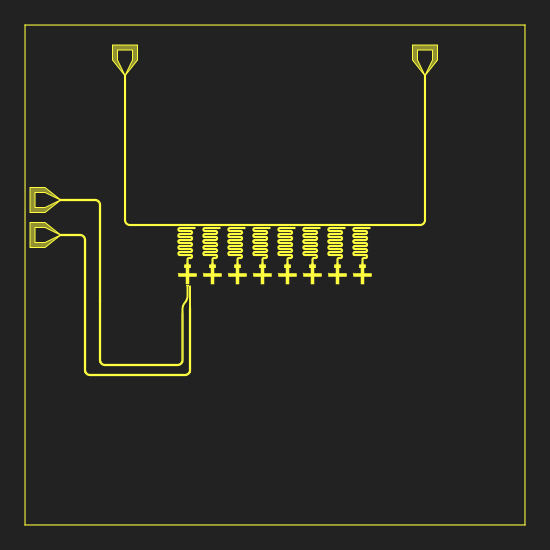

In [10]:
# 设置控制线参数
# 参数****************************************************************************************************
options = Dict(
    name="ControlLineWidthDiff0",                                                                       # 控线名称
    type="ControlLineWidthDiff1",                                                                       # 控制线类型
    chip = "chip0",                                                                                     # 所在芯片层
    path = [(-4300, 800), (-3800, 800), (-3800, -2000), (-1700, -2000), (-1700, -700), (-1700, -220)],  # 控制线路径的坐标点集合
    width=[15, 10],                                                                                     # 
    gap=[5, 4],
    buffer_length = 100,
    corner_radius=100                                                                                   # 拐角半径
)
# 添加控制线
design.gds.control_lines.add(options)

# 参数****************************************************************************************************
options = Dict(
    name="pin_ctl_0",                   # 引脚名称
    type="LaunchPad",                   # 引脚类型
    pos=(-4300, 800),                   # 引脚位置坐标
    trace_width=10,                     
    trace_gap=6,
    taper_height=300,
    pad_width=300,
    pad_height=200,
    pad_gap=100,
    orientation=90,
    start_straight=2000,
    distance_to_chip=350,
    distance_to_qubits=3650
)
#添加引脚
design.gds.pins.add(options)
design.gds.show_svg()

svg文件保存在：./svg/Gds.svg


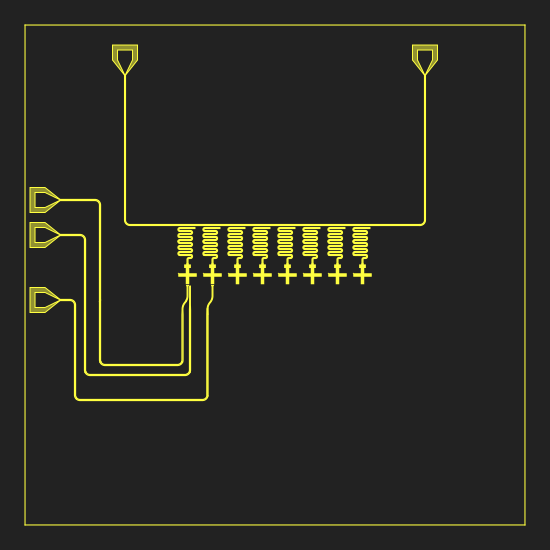

In [11]:
# 设置其他线
options = Dict(
    # 框架
    name="ZlineNju1",
    type="ZlineNju",
    chip="chip0",
    line_init_pos = [(-4300, -500), (-4000, -500), (-4000, -2500), (-1350, -2500), (-1350, -800)],
    line_end_pos = [(-1350, -600), (-1250, -500), (-1250, -220)],
    width = [15,10],
    gap = [5,4],
    short_width = 12,
    short_height = 4,
    long_short_gap = 4,
    long_width_left = 24,
    long_width_right = 12,
    long_height = 2,
    buffer_length = 100,
    corner_radius = [100,200],
    mirror = False,
)
# 添加其他线
design.gds.others.add(options)
# 设置要添加的引脚参数
options = Dict(
    name="pin_zline_1",
    type="LaunchPad",
    pos=(-4300, -500),
    trace_width=10,
    trace_gap=6,
    taper_height=300,
    pad_width=300,
    pad_height=200,
    pad_gap=100,
    orientation=90,
    start_straight=2000,
    distance_to_chip=350,
    distance_to_qubits=3650
)
# 添加引脚
design.gds.pins.add(options)
design.gds.show_svg()

svg文件保存在：./svg/Gds.svg


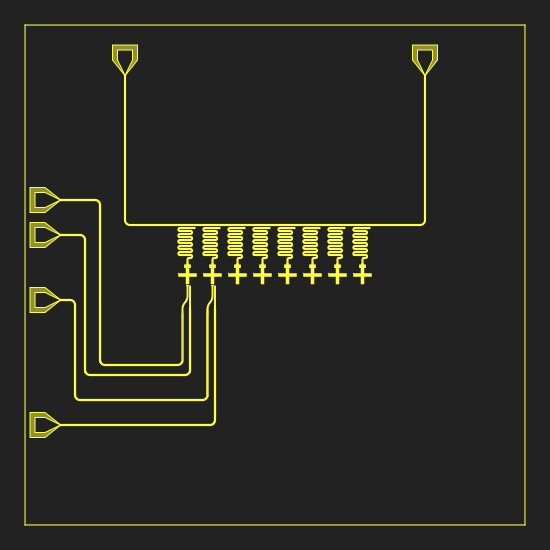

In [12]:
# 设置控制线参数
options = Dict(
    name="ControlLineWidthDiff1",
    type="ControlLineWidthDiff1",
    chip = "chip0",
    path = [(-4300, -3000), (-1200, -3000), (-1200, -700), (-1200, -220)],
    width=[15, 10],
    gap=[5, 4],
    buffer_length = 100,
    corner_radius=100
)
# 添加控制线
design.gds.control_lines.add(options)
# 设置要添加的引脚参数
options = Dict(
    name="pin_ctl_1",
    type="LaunchPad",
    pos=(-4300, -3000),
    trace_width=10,
    trace_gap=6,
    taper_height=300,
    pad_width=300,
    pad_height=200,
    pad_gap=100,
    orientation=90,
    start_straight=2000,
    distance_to_chip=350,
    distance_to_qubits=3650
)
# 添加引脚
design.gds.pins.add(options)
design.gds.show_svg()

svg文件保存在：./svg/Gds.svg


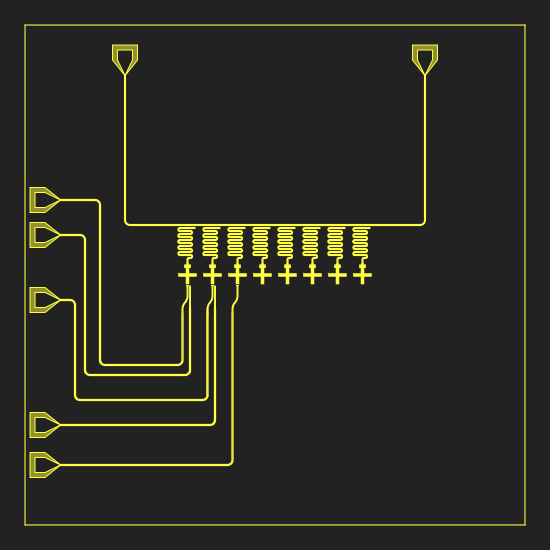

In [13]:
# 设置其他线参数
options = Dict(
    # 框架
    name="ZlineNju2",
    type="ZlineNju",
    chip="chip0",
    line_init_pos = [(-4300, -3800), (-850, -3800), (-850, -800)],
    line_end_pos = [(-850, -600), (-750, -500), (-750, -220)],
    width = [15,10],
    gap = [5,4],
    short_width = 12,
    short_height = 4,
    long_short_gap = 4,
    long_width_left = 24,
    long_width_right = 12,
    long_height = 2,
    buffer_length = 100,
    corner_radius = [100,200],
    mirror = False,
)
# 添加其他线
design.gds.others.add(options)

# 设置引脚参数
options = Dict(
    name="pin_zline_2",
    type="LaunchPad",
    pos=(-4300, -3800),
    trace_width=10,
    trace_gap=6,
    taper_height=300,
    pad_width=300,
    pad_height=200,
    pad_gap=100,
    orientation=90,
    start_straight=2000,
    distance_to_chip=350,
    distance_to_qubits=3650
)
# 添加引脚
design.gds.pins.add(options)
design.gds.show_svg()

svg文件保存在：./svg/Gds.svg


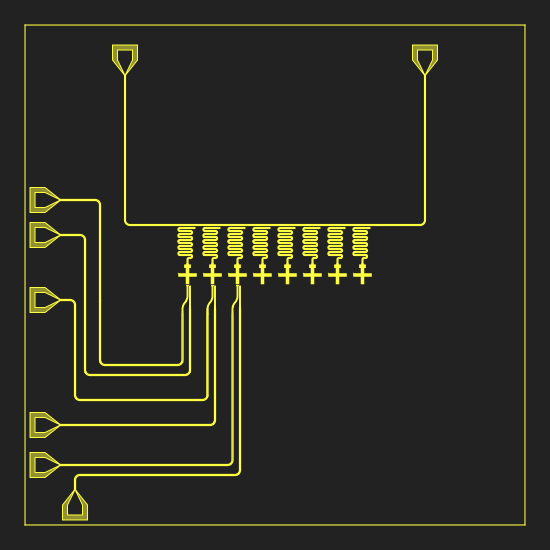

In [14]:
#设置控制线参数
options = Dict(
    name="ControlLineWidthDiff2",
    type="ControlLineWidthDiff1",
    chip = "chip0",
    path = [(-4000, -4300), (-4000, -4000), (-700, -4000), (-700, -700), (-700, -220)],
    width=[15, 10],
    gap=[5, 4],
    buffer_length = 100,
    corner_radius=100
)
# 添加控制线
design.gds.control_lines.add(options)

# 设置引脚参数
options = Dict(
    name="pin_ctl_2",
    type="LaunchPad",
    pos=(-4000, -4300),
    trace_width=10,
    trace_gap=6,
    taper_height=300,
    pad_width=300,
    pad_height=200,
    pad_gap=100,
    orientation=180,
    start_straight=2000,
    distance_to_chip=350,
    distance_to_qubits=3650
)
# 添加引脚
design.gds.pins.add(options)
design.gds.show_svg()

svg文件保存在：./svg/Gds.svg


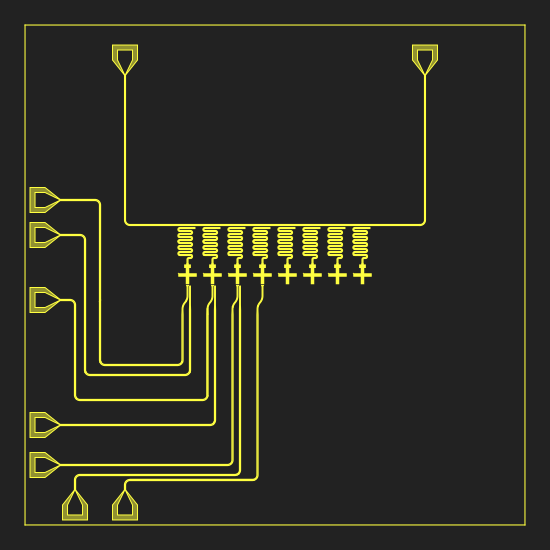

In [15]:
# 设置其他线参数
options = Dict(
    # 框架
    name="ZlineNju3",
    type="ZlineNju",
    chip="chip0",
    line_init_pos = [(-3000, -4300), (-3000, -4100), (-350, -4100), (-350, -800)],
    line_end_pos = [(-350, -600), (-250, -500), (-250, -220)],
    width = [15,10],
    gap = [5,4],
    short_width = 12,
    short_height = 4,
    long_short_gap = 4,
    long_width_left = 24,
    long_width_right = 12,
    long_height = 2,
    buffer_length = 100,
    corner_radius = [100,200],
    mirror = False,
)
# 添加其他线
design.gds.others.add(options)

# 设置引脚参数
options = Dict(
    name="pin_zline_3",
    type="LaunchPad",
    pos=(-3000, -4300),
    trace_width=10,
    trace_gap=6,
    taper_height=300,
    pad_width=300,
    pad_height=200,
    pad_gap=100,
    orientation=180,
    start_straight=2000,
    distance_to_chip=350,
    distance_to_qubits=3650
)
# 添加引脚
design.gds.pins.add(options)
design.gds.show_svg()

svg文件保存在：./svg/Gds.svg


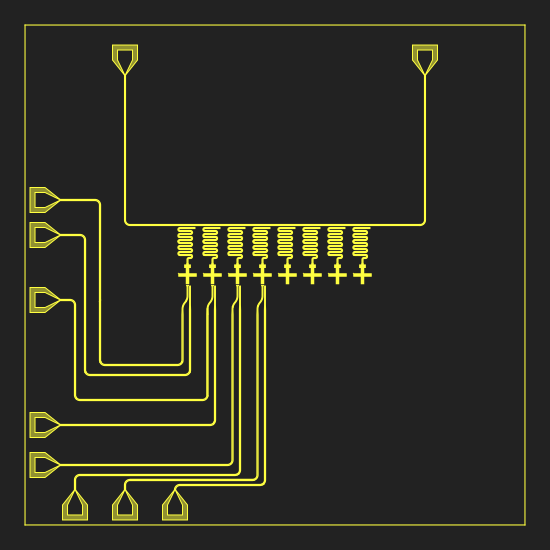

In [16]:
# 设置控制线参数
options = Dict(
    name="ControlLineWidthDiff3",
    type="ControlLineWidthDiff1",
    chip = "chip0",
    path = [(-2000, -4300), (-2000, -4200), (-200, -4200), (-200, -700), (-200, -220)],
    width=[15, 10],
    gap=[5, 4],
    buffer_length = 100,
    corner_radius=100
)
# 添加控制线
design.gds.control_lines.add(options)

# 设置引脚参数
options = Dict(
    name="pin_ctl_3",
    type="LaunchPad",
    pos=(-2000, -4300),
    trace_width=10,
    trace_gap=6,
    taper_height=300,
    pad_width=300,
    pad_height=200,
    pad_gap=100,
    orientation=180,
    start_straight=2000,
    distance_to_chip=350,
    distance_to_qubits=3650
)
# 添加引脚
design.gds.pins.add(options)
design.gds.show_svg()
design.gds.show_gds()

In [17]:
# 批量改变引脚参数
# 将name_list中引脚名称为pin_ctl_0.....pin_zline_3 的引脚的"trace_width"值改成15
design.gds.pins.batch_change(name_list=["pin_ctl_0",
                                        "pin_ctl_1",
                                        "pin_ctl_2",
                                        "pin_ctl_3",
                                        "pin_zline_0",
                                        "pin_zline_1",
                                        "pin_zline_2",
                                        "pin_zline_3"],     # 要改变的引脚的名称
                             op_name="trace_width",         # 要改变的引脚参数名
                             op_value=15)                   # 为要改变的参数赋值
# 批量改变引脚参数
# 将name_list中引脚名称为pin_ctl_0.....pin_zline_3 的引脚的"trace_gap"值改成5
design.gds.pins.batch_change(name_list=["pin_ctl_0",
                                        "pin_ctl_1",
                                        "pin_ctl_2",
                                        "pin_ctl_3",
                                        "pin_zline_0",
                                        "pin_zline_1",
                                        "pin_zline_2",
                                        "pin_zline_3"],
                             op_name="trace_gap",
                             op_value=5)

svg文件保存在：./svg/Gds.svg


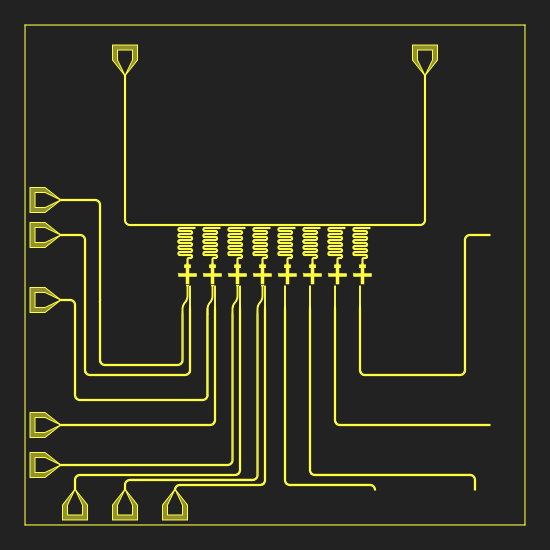

In [18]:
# 镜像生成控制线
design.gds.control_lines.mirror_ControlLine(name_list=["ControlLineWidthDiff0",
                                                       "ControlLineWidthDiff1",
                                                       "ControlLineWidthDiff2",
                                                       "ControlLineWidthDiff3"])    # name_list为要镜像生成的控制线的名称
design.gds.show_svg()
design.gds.show_gds()

svg文件保存在：./svg/Gds.svg


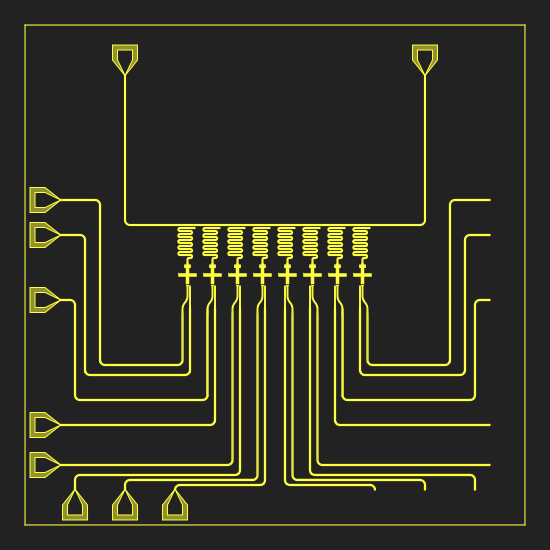

In [19]:
# 镜像生成其他各种线
design.gds.others.mirror_ZlineNju(name_list=["ZlineNju0",
                                             "ZlineNju1",
                                             "ZlineNju2",
                                             "ZlineNju3"])  # name_list为要镜像的线的名称
design.gds.show_svg()
design.gds.show_gds()

In [20]:
# 镜像生成引脚
design.gds.pins.mirror_LaunchPad(name_list=["pin_ctl_0",
                                            "pin_ctl_1",
                                            "pin_ctl_2",
                                            "pin_ctl_3",
                                            "pin_zline_0",
                                            "pin_zline_1",
                                            "pin_zline_2",
                                            "pin_zline_3",])  # name_list为要镜像生成的引脚的名称

svg文件保存在：./svg/Gds.svg


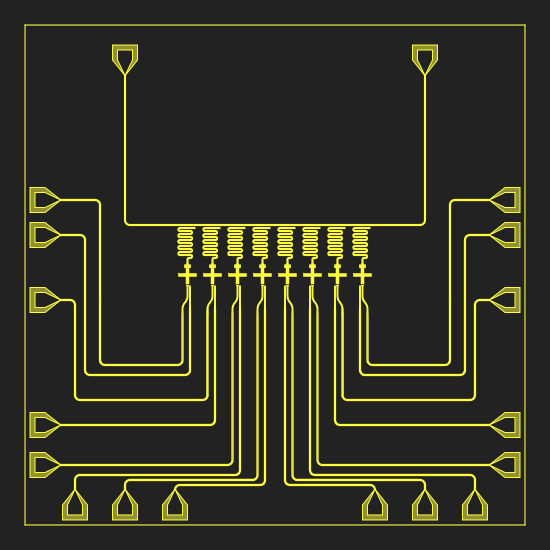

'./20240617nju.gds'

In [21]:
design.gds.show_svg()
# 显示gds版图
design.gds.show_gds()
# 保存gds版图为"20240617nju.gds"
design.gds.save_gds("./20240617nju.gds")